In [2]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from PIL import Image
from torch import optim
from torchvision import datasets, models, transforms

device = "cuda" if torch.cuda.is_available() else "cpu"
import glob
from glob import glob

import cv2
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import numpy as np
import pandas as pd
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image

In [3]:
class SimilarDataset(Dataset):
    def __init__(self, path='dataset 2/'):
        self.data = sorted(glob(f'{path}/*.png'))
        # self.normalize = transforms.Normalize(
        #     mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
        # )

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        f = self.data[idx]
        im = Image.open(f).convert("RGB")
        # im = cv2.resize(im, (224, 224))
        im = transforms.Resize((224, 224))(im)
        im = transforms.ToTensor()(im)
        # im = im.resize((-1, 224, 224))
        # im = im.permute(2, 0, 1)
        # im = self.normalize(im)
        return im.float()

In [4]:
data = SimilarDataset()
im = data[4]

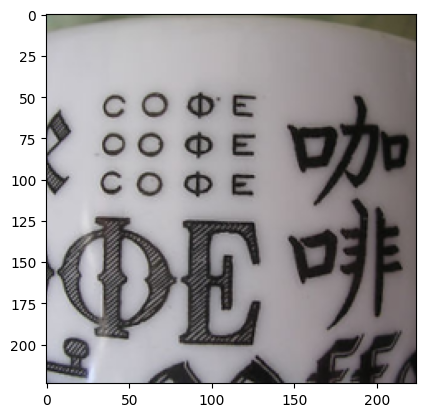

In [5]:
plt.imshow(im.permute(1, 2, 0).cpu())

In [6]:
train_size = int(len(data) * 0.75)
val_size = len(data) - train_size

In [7]:
# split data to train and test
train_dataset, val_dataset = torch.utils.data.random_split(data, [train_size, val_size]) 

# create the train dataloader
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
 
# create the validation dataloader
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32)

# create the full dataloader
full_loader = torch.utils.data.DataLoader(data, batch_size=32)

In [8]:
device = "cuda"

In [11]:
import torch
from torchvision import models, transforms

# Load a pre-trained Vision Transformer model
model = models.vit_b_16(weights="ViT_B_16_Weights.DEFAULT").to(device)
model.eval()

# Define image transformations
transform = transforms.Compose([
    # transforms.ToTensor(),
    transforms.Resize((224, 224)),
])

# Function to extract features
def extract_features(batch):
    # image = Image.open(image_path)
    image = batch
    image = image.to(device)
    # image = transform(image).unsqueeze(0).to(device)  # Add batch dimension
    with torch.no_grad():
        features = model(image)
    return features

In [12]:
from tqdm.notebook import tqdm
from joblib import Parallel, delayed

def process(image, i):
    feat = extract_features(image).cpu()
    return {i: feat}

results = Parallel(n_jobs=1)(delayed(process)(batch, i) for i, batch in tqdm(enumerate(full_loader), total=len(data)//32))
print(results)  # prints [0, 1, 4, 9, 16, 25, 36, 49, 64, 81]


  0%|          | 0/300 [00:00<?, ?it/s]

[{0: tensor([[-0.4888, -0.0795, -0.1678,  ..., -0.0229, -0.6292,  0.5627],
        [-0.3828, -0.2996, -0.4503,  ..., -0.5770,  0.4087,  0.7741],
        [-2.1018, -0.8295, -1.0488,  ..., -2.1380, -0.4013,  2.4142],
        ...,
        [-0.3187, -0.5823, -0.2790,  ..., -0.2774,  0.0790,  1.6176],
        [-1.4517, -1.1949, -0.8783,  ..., -1.7849, -0.7522,  1.2127],
        [-0.4524,  0.3914, -1.0963,  ..., -0.8282, -1.0000,  0.6332]])}, {1: tensor([[-1.0437, -0.7094, -0.6600,  ..., -1.4355, -0.4929,  0.7508],
        [-0.8312, -1.3709, -1.2516,  ..., -0.8014, -0.2560,  2.3161],
        [-0.9863,  0.3404,  0.2487,  ..., -0.7204, -0.5590, -0.0502],
        ...,
        [-0.7914, -0.4742, -0.1340,  ...,  0.0552,  0.2435,  0.4028],
        [-0.5621, -0.4742, -1.3379,  ..., -0.9622,  0.0113,  0.1170],
        [-0.2776, -0.1989, -0.2386,  ..., -1.1832, -0.5613,  0.0257]])}, {2: tensor([[-0.1933,  0.1750, -0.3643,  ...,  0.3697, -0.5688, -0.6324],
        [-0.8720, -0.3882, -0.3014,  ..., -1.

In [13]:
from tqdm.notebook import tqdm

import torch.nn.functional as F

features = []
for batch_num in tqdm(range(len(results))):
    batch = list(results[batch_num].values())[0]
    for i in range(len(batch)):
        features.append(batch[i])

features

  0%|          | 0/301 [00:00<?, ?it/s]

[tensor([-4.8883e-01, -7.9528e-02, -1.6780e-01, -4.9099e-02,  4.4659e-02,
          1.5719e-01, -3.4555e-01,  3.4071e-01,  1.2271e+00, -2.4109e-01,
          1.7521e+00,  1.5324e-01,  2.6515e+00,  4.8357e+00,  2.4897e+00,
          7.9499e+00,  4.2149e+00,  4.0838e+00,  4.3787e+00,  3.5209e+00,
          5.7306e+00,  1.3705e+00, -1.7415e-01,  1.3412e+00, -3.6675e-01,
          1.0943e-01,  1.7225e-01,  6.1825e-01, -1.1466e-01,  4.9951e-01,
          4.3563e-01, -2.4176e-02,  2.5763e-02, -7.5882e-01, -4.4460e-01,
         -3.8051e-01,  2.7850e-01, -5.1250e-01,  4.3226e-01,  1.9670e-01,
         -1.1922e-01,  3.7127e-01,  9.6975e-02,  1.1246e-01, -6.5964e-02,
         -4.9156e-01,  1.0353e-03,  1.6313e-01, -3.6857e-01, -2.6286e-02,
         -6.5133e-02, -4.2438e-01,  4.0227e-01,  1.2384e-01,  5.5268e-01,
          1.1508e-02, -1.0834e-01, -6.2699e-02,  6.7444e-01,  4.2813e-01,
          3.7561e-01, -7.7614e-02, -3.4454e-01, -2.9327e-01, -1.8345e-01,
         -2.4164e-02,  2.5051e-01, -2.

In [14]:
len(features)

9605

In [17]:
features_tensor = torch.from_numpy(np.array(features))
features_tensor.shape

torch.Size([9605, 1000])

In [18]:
a_norm = features_tensor / features_tensor.norm(dim=1)[:, None]
aa = torch.mm(a_norm, a_norm.transpose(0,1))
print(aa)

tensor([[1.0000, 0.2761, 0.1358,  ..., 0.1786, 0.0467, 0.4329],
        [0.2761, 1.0000, 0.2302,  ..., 0.2607, 0.0807, 0.5008],
        [0.1358, 0.2302, 1.0000,  ..., 0.3237, 0.0354, 0.3525],
        ...,
        [0.1786, 0.2607, 0.3237,  ..., 1.0000, 0.0659, 0.3345],
        [0.0467, 0.0807, 0.0354,  ..., 0.0659, 1.0000, 0.2196],
        [0.4329, 0.5008, 0.3525,  ..., 0.3345, 0.2196, 1.0000]])


In [30]:
ratings = aa.argsort(dim=1,descending=True)
ratings

tensor([[   0, 5486, 4395,  ..., 6538, 1506, 8336],
        [   1, 5193, 1149,  ..., 5340, 1040, 5229],
        [   2, 3795, 8952,  ..., 7901, 2929, 5401],
        ...,
        [9602, 4789, 5715,  ..., 8843, 8961, 5770],
        [9603, 8022, 5323,  ..., 1575, 8393,  314],
        [9604, 1517, 8247,  ..., 4180,  602, 6291]])

In [34]:
torch.save(ratings, "results/ratings.pt")
torch.save(aa, "results/distances.pt")
torch.save(features_tensor, "results/features.pt")

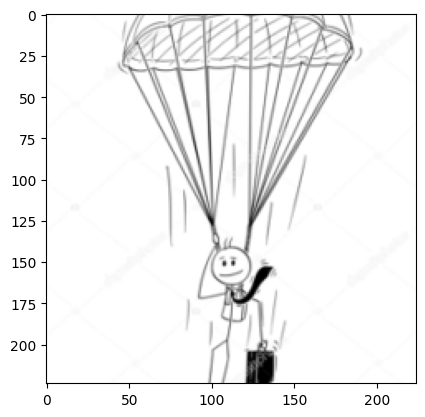

In [47]:
idx = 5
target = data[idx]
plt.imshow(target.permute(1, 2, 0).cpu())

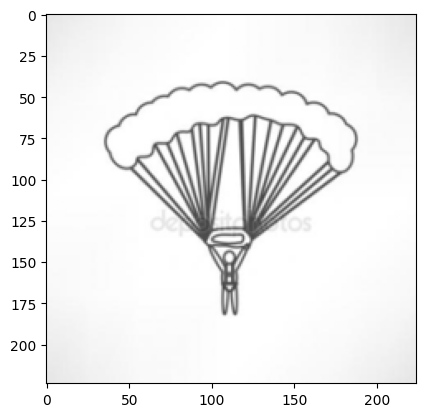

In [48]:
similar_target = data[ratings[idx][1].item()]
plt.imshow(similar_target.permute(1, 2, 0).cpu())

In [49]:
ans = pd.DataFrame()

In [55]:
ratings[0][1:7].detach().numpy()

array([5486, 4395, 7054, 5426,  157,  912])

In [58]:
for i, f in enumerate(data.data):
    name = f.split("/")[1]
    anal = ratings[i][1:7]
    anal_names = [data.data[j].split("/")[1] for j in anal.detach().numpy()]
    # print(anal_names)
    line = pd.DataFrame({"filename": [name], "ranking": " ".join(anal_names)})
    # print(line)
    ans = pd.concat([ans, line], ignore_index=True)
ans

,filename,ranking
0,0000.png,5486.png 4395.png 7054.png 5426.png 0157.png 0...
1,0001.png,5193.png 1149.png 3986.png 2368.png 1511.png 1...
2,0002.png,3795.png 8952.png 7688.png 1912.png 3816.png 6...
3,0003.png,7365.png 9091.png 3450.png 2243.png 5256.png 5...
4,0004.png,6371.png 7238.png 4191.png 4593.png 2917.png 4...
...,...,...
9600,9600.png,4238.png 7029.png 2523.png 1197.png 7875.png 7...
9601,9601.png,5171.png 0215.png 2634.png 4463.png 3854.png 5...
9602,9602.png,4789.png 5715.png 8219.png 2158.png 6289.png 5...
9603,9603.png,8022.png 5323.png 7483.png 1286.png 6298.png 6...


In [59]:
ans.to_csv("results/ans.csv", index=False)